## Subject:CS 577
## Semester: FALL 22
## Deep Learning Project
Image Super Resolution dataset of the project where we used the image size 256x256x3

In [1]:
import os 
import re 

from tqdm import tqdm
from tensorflow.keras.preprocessing.image import img_to_array

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, ZeroPadding2D, ReLU, Add, Input

import matplotlib.pyplot as plt
import numpy as np
np. random. seed(0)
import cv2 as cv2

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense ,Conv2D,MaxPooling2D ,Dropout
from tensorflow.keras.layers import Conv2DTranspose, UpSampling2D, add ,concatenate
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
import tensorflow as tf
from keras.backend import resize_images


Loading dataset and creating low resolution images of said dataset.

In [5]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = 'C:/Users/edbar/Desktop/Illinois Institute of Technology/1 er Semestre/Deep Learning/Project Final/dataset/Raw Data/high_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '855.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = 'C:/Users/edbar/Desktop/Illinois Institute of Technology/1 er Semestre/Deep Learning/Project Final/dataset/Raw Data/low_res'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '855.jpg':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 855/855 [00:02<00:00, 374.50it/s]


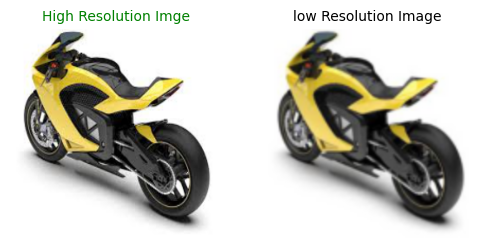

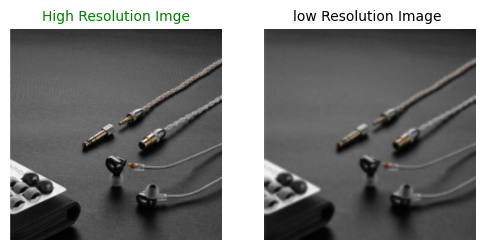

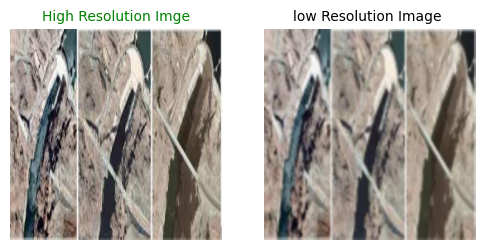

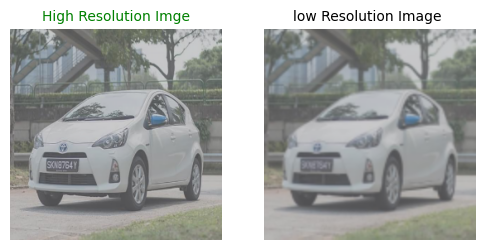

In [4]:
for i in range(4):
    a = np.random.randint(0,100)
    plt.figure(figsize=(6,6))
    plt.subplot(1,2,1)
    plt.title('High Resolution Imge', color = 'green', fontsize = 10)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('low Resolution Image ', color = 'black', fontsize = 10)
    plt.imshow(low_img[a])
    plt.axis('off')

Creating training, validation and test split.

In [6]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.array(train_high_image)
train_low_image = np.array(train_low_image)
#train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
#train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:830]
validation_low_image = low_img[700:830]
validation_high_image=np.array(validation_high_image)
validation_low_image = np.array(validation_low_image)
#validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
#validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[830:]
test_low_image = low_img[830:]
test_high_image=np.array(test_high_image)
test_low_image=np.array(test_low_image)
#test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
#test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)

Shape of training images: (700, 256, 256, 3)
Shape of test images: (25, 256, 256, 3)
Shape of validation images: (130, 256, 256, 3)


In [12]:
from math import log10, sqrt
import cv2
import numpy as np
  
def PSNR(y_true, y_pred):
    
    psnr_val = []
    for i in range(len(y_true)):
        mse = np.mean((y_true[i]-y_pred[i]) ** 2)
        if(mse == 0):
            psnr_val.append(100.0)
        else:
            max_pixel = 255.0
            psnr_val.append(20*log10(max_pixel/sqrt(mse)))
        
    return psnr_val

In [28]:
def plot(history):
    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.legend()
    plt.show()
    
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.legend()
    plt.show()

In [10]:
def plot_psnr(x):
    f = plt.figure()
    f.set_size_inches(20,4)
    plt.plot(x, label='PSNR values')
    plt.legend()
    plt.show()
    print('Maximum psnr value:',max(x))
    print('Minimum PSNR value:',min(x))
    avg = sum(x)/len(x)
    print('Average PSNR value:',avg)

In [20]:
def plot_output(y_true,y_input,y_pred,x):
    for i in range(3):
        fig, ax = plt.subplots(1,3)
        fig.set_size_inches(8,8)
        fig.set_facecolor('w')

        ax[0].imshow(y_true[i])
        ax[0].set_title('High Resolution Image', fontsize=8)
        ax[0].axis('off')

        ax[1].imshow(y_input[i])
        ax[1].set_title('Low Resolution Image', fontsize=8)
        ax[1].axis('off')

        ax[2].imshow(y_pred[i])
        ax[2].set_title('Predicted Image', fontsize=8)
        ax[2].axis('off')
        plt.axis('off')
        plt.show()
        print('PSNR value',x[i])

In [7]:
def VDSR_5(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    r = Conv2D(1,(3,3), padding='same')(r4)
    out = Add()([lr,r])
    return Model(lr,out)

In [23]:
def VDSR10(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    r = Conv2D(1,(3,3), padding='same')(r10)
    out = Add()([lr,r])
    return Model(lr,out)

In [24]:
def VDSR15(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    c10 = Conv2D(64,(3,3), padding='same')(r10)
    r11 = ReLU()(c10)
    c11 = Conv2D(64,(3,3), padding='same')(r11)
    r12 = ReLU()(c11)
    c12 = Conv2D(64,(3,3), padding='same')(r12)
    r13 = ReLU()(c12)
    c13 = Conv2D(64,(3,3), padding='same')(r13)
    r14 = ReLU()(c13)
    c14 = Conv2D(64,(3,3), padding='same')(r14)
    r15 = ReLU()(c14)
    r = Conv2D(1,(3,3), padding='same')(r15)
    out = Add()([lr,r])
    return Model(lr,out)

In [40]:
def VDSR20(inp):
    lr = Input(shape=(inp))
    c1 = Conv2D(64,(3,3), padding='same')(lr)
    r1 = ReLU()(c1)
    c2 = Conv2D(64,(3,3), padding='same')(r1)
    r2 = ReLU()(c2)
    c3 = Conv2D(64,(3,3), padding='same')(r2)
    r3 = ReLU()(c3)
    c4 = Conv2D(64,(3,3), padding='same')(r3)
    r4 = ReLU()(c4)
    c5 = Conv2D(64,(3,3), padding='same')(r4)
    r5 = ReLU()(c5)
    c6 = Conv2D(64,(3,3),padding='same')(r5)
    r6 = ReLU()(c6)
    c7 = Conv2D(64,(3,3),padding='same')(r6)
    r7 = ReLU()(c7)
    c8 = Conv2D(64,(3,3),padding='same')(r7)
    r8 = ReLU()(c8)
    c9 = Conv2D(64,(3,3),padding='same')(r8)
    r10 = ReLU()(c9)
    c10 = Conv2D(64,(3,3), padding='same')(r10)
    r11 = ReLU()(c10)
    c11 = Conv2D(64,(3,3), padding='same')(r11)
    r12 = ReLU()(c11)
    c12 = Conv2D(64,(3,3), padding='same')(r12)
    r13 = ReLU()(c12)
    c13 = Conv2D(64,(3,3), padding='same')(r13)
    r14 = ReLU()(c13)
    c14 = Conv2D(64,(3,3), padding='same')(r14)
    r15 = ReLU()(c14)
    c15 = Conv2D(64,(3,3), padding='same')(r15)
    r16 = ReLU()(c15)
    c16 = Conv2D(64,(3,3), padding='same')(r16)
    r17 = ReLU()(c16)
    c17 = Conv2D(64,(3,3), padding='same')(r17)
    r18 = ReLU()(c17)
    c18 = Conv2D(64,(3,3), padding='same')(r18)
    r19 = ReLU()(c18)
    c19 = Conv2D(64,(3,3), padding='same')(r19)
    r20 = ReLU()(c19) 
    r = Conv2D(1,(3,3), padding='same')(r20)
    out = Add()([lr,r])
    return Model(lr,out)

In [21]:
def plot_output_final(y_true,y_input,y_pred,x):
    for i in range(len(y_true)):
        fig, ax = plt.subplots(1,3)
        fig.set_size_inches(12,6)
        fig.set_facecolor('w')

        ax[0].imshow(y_true[i])
        ax[0].set_title('High Resolution Image', fontsize=14)
        ax[0].axis('off')

        ax[1].imshow(y_input[i])
        ax[1].set_title('Low Resolution Image', fontsize=14)
        ax[1].axis('off')

        ax[2].imshow(y_pred[i])
        ax[2].set_title('Predicted Image', fontsize=14)
        ax[2].axis('off')
        plt.axis('off')
        plt.show()
        print('PSNR value',x[i])

## Layer 5 Model

In [8]:
inp = train_high_image.shape[1:]
model_l5_ep5 = VDSR_5(inp)
model_l5_ep5.summary()
model_l5_ep5.compile(optimizer=Adam(learning_rate=0.0001,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 256, 256, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       re_lu[0][0]                      
______________________________________________________________________________________________

In [9]:
result_ml5 = model_l5_ep5.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=5,batch_size=5)

Epoch 1/5
140/140 [==============================] - 15s 60ms/step - loss: 0.0013 - accuracy: 0.9658 - val_loss: 0.0011 - val_accuracy: 0.9673
Epoch 2/5
140/140 [==============================] - 8s 57ms/step - loss: 0.0011 - accuracy: 0.9658 - val_loss: 0.0011 - val_accuracy: 0.9673
Epoch 3/5
140/140 [==============================] - 8s 58ms/step - loss: 0.0010 - accuracy: 0.9658 - val_loss: 0.0011 - val_accuracy: 0.9673
Epoch 4/5
140/140 [==============================] - 8s 58ms/step - loss: 0.0010 - accuracy: 0.9658 - val_loss: 0.0010 - val_accuracy: 0.9673
Epoch 5/5
140/140 [==============================] - 8s 58ms/step - loss: 9.8979e-04 - accuracy: 0.9658 - val_loss: 0.0010 - val_accuracy: 0.9673


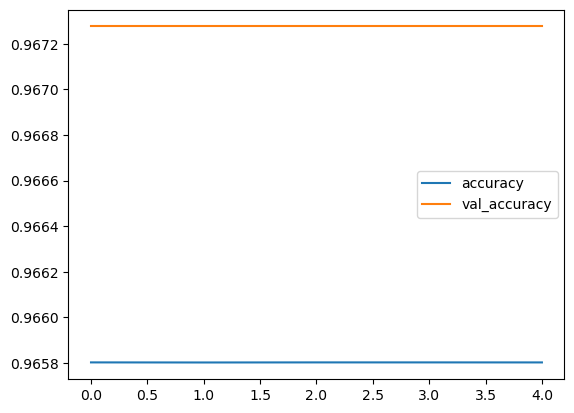

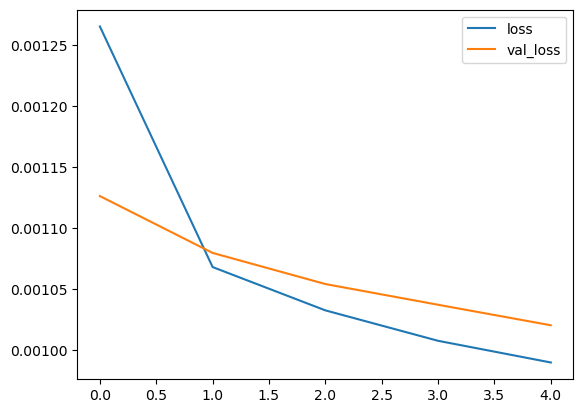

In [30]:
plot(result_ml5)

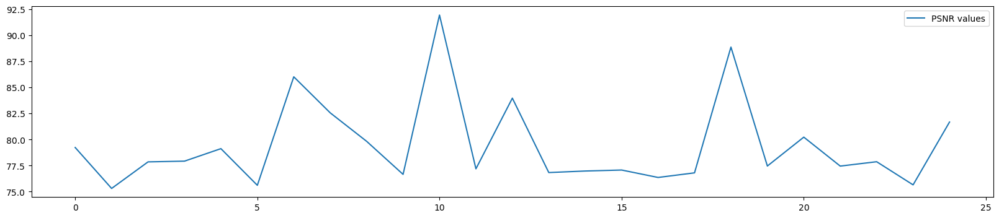

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 91.93375984978093
Minimum PSNR value: 75.30735197984922
Average PSNR value: 79.45693001774035


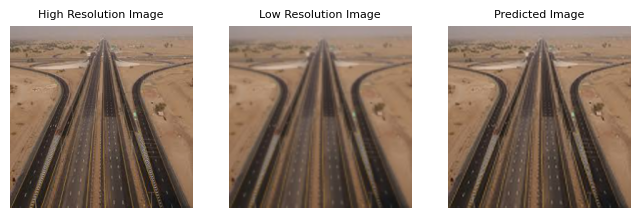

PSNR value 79.23257195028756


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


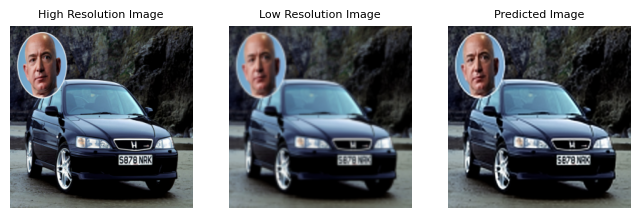

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 75.30735197984922


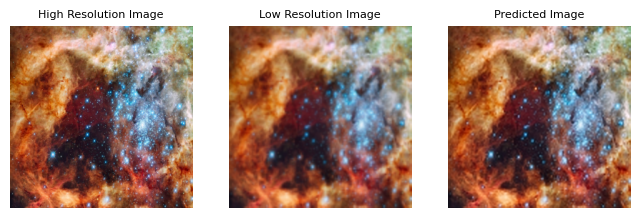

PSNR value 77.85446452788021


In [14]:
ml_5_pred = model_l5_ep5.predict(test_low_image)
ml_5_psnr = PSNR(test_high_image,ml_5_pred)
plot_psnr(ml_5_psnr)
plot_output(test_high_image,test_low_image,ml_5_pred,ml_5_psnr)

In [18]:
model_l5_ep5.save_weights('256x256_5_layer_w.h5')

## Layer 10 Model

In [25]:
model_l10 = VDSR10(inp)
model_l10.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 256, 256, 64) 1792        input_2[0][0]                    
__________________________________________________________________________________________________
re_lu_4 (ReLU)                  (None, 256, 256, 64) 0           conv2d_5[0][0]                   
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 256, 256, 64) 36928       re_lu_4[0][0]                    
____________________________________________________________________________________________

In [27]:
model_l10.compile(optimizer=Adam(learning_rate=0.0005,beta_1=0.9), loss='mse', metrics=['accuracy'])
result_ml10 = model_l10.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10, batch_size=5)


Epoch 1/10
140/140 [==============================] - 20s 136ms/step - loss: 0.0012 - accuracy: 0.9658 - val_loss: 0.0010 - val_accuracy: 0.9673
Epoch 2/10
140/140 [==============================] - 19s 136ms/step - loss: 9.4789e-04 - accuracy: 0.9658 - val_loss: 9.5382e-04 - val_accuracy: 0.9673
Epoch 3/10
140/140 [==============================] - 19s 137ms/step - loss: 9.1315e-04 - accuracy: 0.9658 - val_loss: 9.3562e-04 - val_accuracy: 0.9673
Epoch 4/10
140/140 [==============================] - 19s 138ms/step - loss: 8.8192e-04 - accuracy: 0.9658 - val_loss: 9.1837e-04 - val_accuracy: 0.9673
Epoch 5/10
140/140 [==============================] - 19s 138ms/step - loss: 8.6659e-04 - accuracy: 0.9658 - val_loss: 9.0492e-04 - val_accuracy: 0.9673
Epoch 6/10
140/140 [==============================] - 19s 138ms/step - loss: 8.5762e-04 - accuracy: 0.9658 - val_loss: 8.9926e-04 - val_accuracy: 0.9673
Epoch 7/10
140/140 [==============================] - 19s 138ms/step - loss: 8.5540e-04 - 

NameError: name 'plot' is not defined

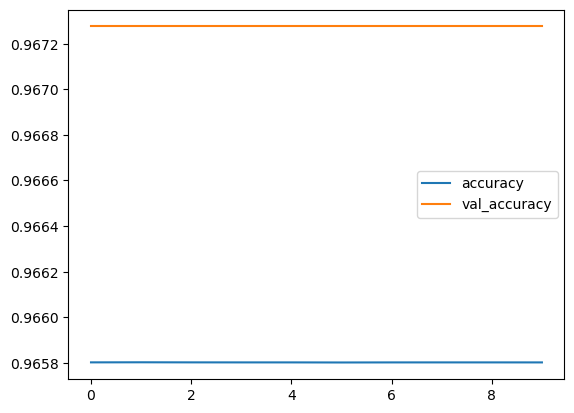

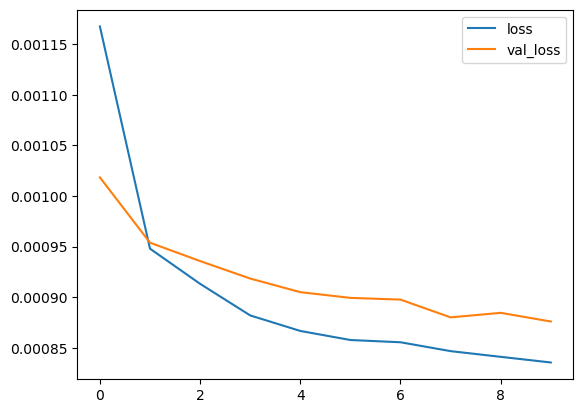

In [29]:
plot(result_ml10)

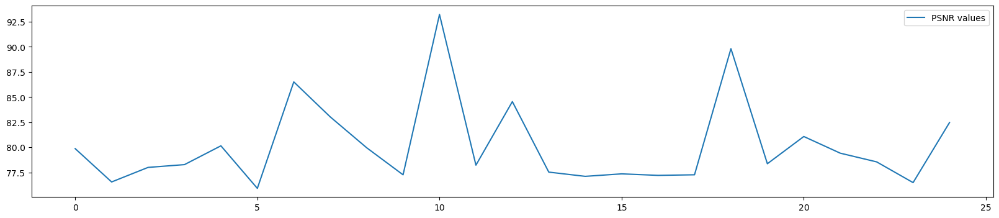

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 93.2173304563211
Minimum PSNR value: 75.92321330141901
Average PSNR value: 80.17222361825993


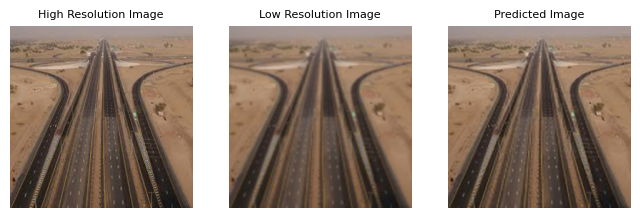

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 79.87398332281539


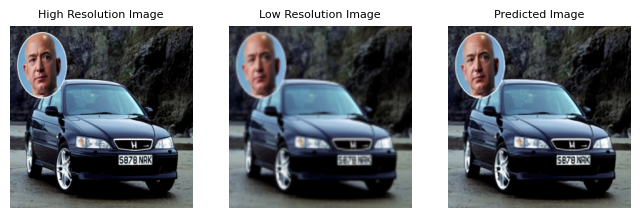

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 76.5602786237957


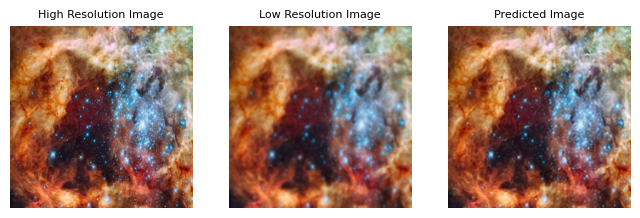

PSNR value 78.00669344045203


In [31]:
ml_10_pred = model_l10.predict(test_low_image)
ml_10_psnr = PSNR(test_high_image,ml_10_pred)
plot_psnr(ml_10_psnr)
plot_output(test_high_image,test_low_image,ml_10_pred,ml_10_psnr)

In [32]:
model_l10.save_weights('256x256_10_layer_w.h5')

## Layer 15 Model

In [34]:
model_l15=VDSR15(inp)
model_l15.summary()
model_l15.compile(optimizer=Adam(learning_rate=0.0007,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 256, 256, 64) 1792        input_3[0][0]                    
__________________________________________________________________________________________________
re_lu_13 (ReLU)                 (None, 256, 256, 64) 0           conv2d_15[0][0]                  
__________________________________________________________________________________________________
conv2d_16 (Conv2D)              (None, 256, 256, 64) 36928       re_lu_13[0][0]                   
____________________________________________________________________________________________

Epoch 1/10
140/140 [==============================] - 31s 215ms/step - loss: 0.0013 - accuracy: 0.9658 - val_loss: 0.0010 - val_accuracy: 0.9673
Epoch 2/10
140/140 [==============================] - 30s 215ms/step - loss: 9.5158e-04 - accuracy: 0.9658 - val_loss: 9.6485e-04 - val_accuracy: 0.9673
Epoch 3/10
140/140 [==============================] - 30s 216ms/step - loss: 9.0494e-04 - accuracy: 0.9658 - val_loss: 9.2581e-04 - val_accuracy: 0.9673
Epoch 4/10
140/140 [==============================] - 31s 219ms/step - loss: 8.7873e-04 - accuracy: 0.9658 - val_loss: 9.0458e-04 - val_accuracy: 0.9673
Epoch 5/10
140/140 [==============================] - 31s 222ms/step - loss: 8.6210e-04 - accuracy: 0.9658 - val_loss: 9.0538e-04 - val_accuracy: 0.9673
Epoch 6/10
140/140 [==============================] - 31s 223ms/step - loss: 8.5246e-04 - accuracy: 0.9658 - val_loss: 9.0235e-04 - val_accuracy: 0.9673
Epoch 7/10
140/140 [==============================] - 31s 223ms/step - loss: 8.4211e-04 - 

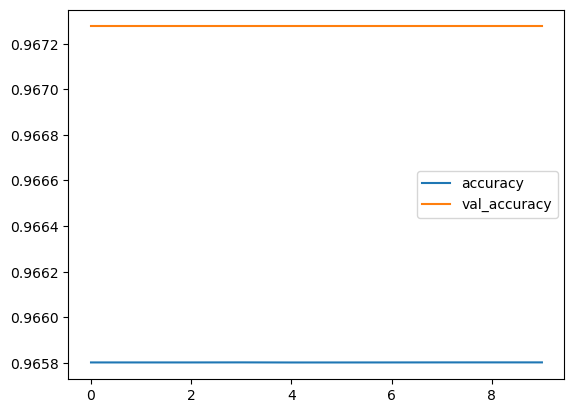

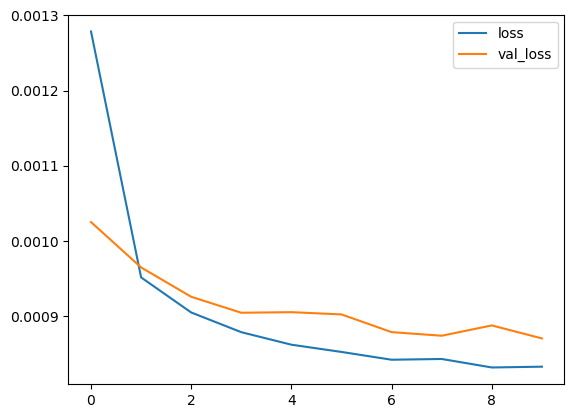

In [35]:
result_ml15 = model_l15.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=10, batch_size=5)
plot(result_ml15)

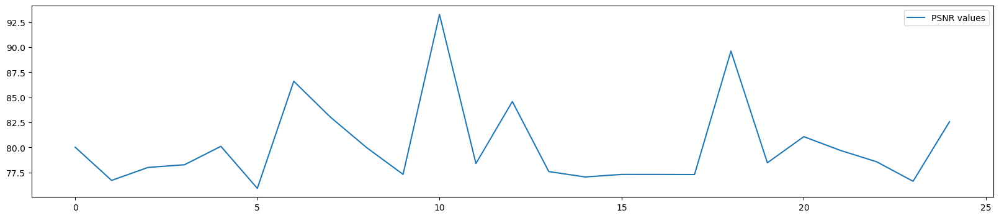

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 93.25661942277631
Minimum PSNR value: 75.92811228773063
Average PSNR value: 80.22239996358779


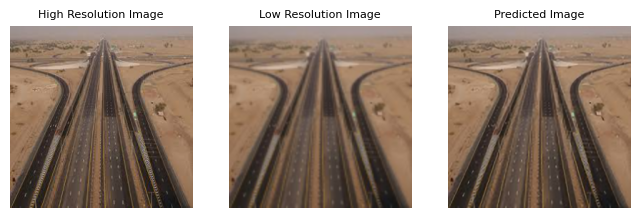

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 80.02784081695664


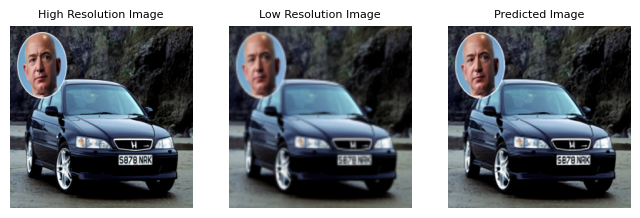

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 76.72142622208558


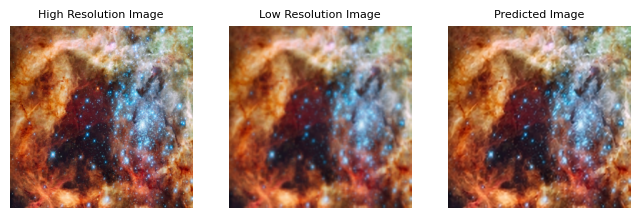

PSNR value 78.01326026828049


In [36]:
ml_15_pred = model_l15.predict(test_low_image)
ml_15_psnr = PSNR(test_high_image,ml_15_pred)
plot_psnr(ml_15_psnr)
plot_output(test_high_image,test_low_image,ml_15_pred,ml_15_psnr)

In [37]:
model_l15.save_weights('256x256_15_layer_w.h5')

## Layer 20 Model

In [41]:
model_l20 = VDSR20(inp)
model_l20.summary()
model_l20.compile(optimizer=Adam(learning_rate=0.0009,beta_1=0.9), loss='mse', metrics=['accuracy'])

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_30 (Conv2D)              (None, 256, 256, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
re_lu_27 (ReLU)                 (None, 256, 256, 64) 0           conv2d_30[0][0]                  
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, 256, 256, 64) 36928       re_lu_27[0][0]                   
____________________________________________________________________________________________

Epoch 1/5
700/700 [==============================] - 48s 67ms/step - loss: 0.0013 - accuracy: 0.9658 - val_loss: 9.9113e-04 - val_accuracy: 0.9673
Epoch 2/5
700/700 [==============================] - 47s 67ms/step - loss: 9.6286e-04 - accuracy: 0.9658 - val_loss: 9.4289e-04 - val_accuracy: 0.9673
Epoch 3/5
700/700 [==============================] - 47s 67ms/step - loss: 9.0622e-04 - accuracy: 0.9658 - val_loss: 9.6071e-04 - val_accuracy: 0.9673
Epoch 4/5
700/700 [==============================] - 47s 68ms/step - loss: 8.8114e-04 - accuracy: 0.9658 - val_loss: 8.9595e-04 - val_accuracy: 0.9673
Epoch 5/5
700/700 [==============================] - 47s 68ms/step - loss: 8.7439e-04 - accuracy: 0.9658 - val_loss: 8.9713e-04 - val_accuracy: 0.9673


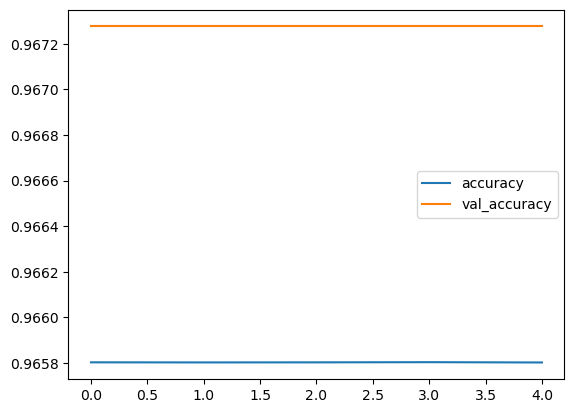

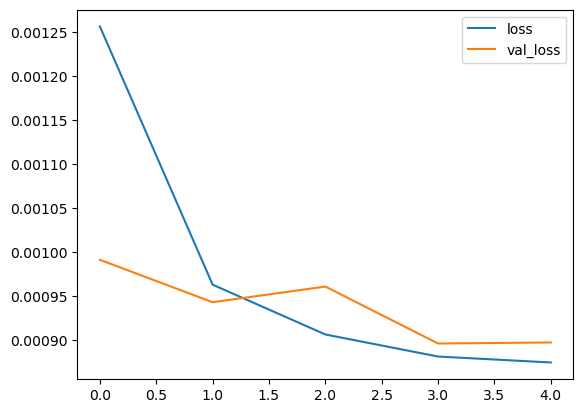

In [43]:
result_ml20 = model_l20.fit(train_low_image, train_high_image, validation_data=(validation_low_image, validation_high_image), epochs=5, batch_size=1)
plot(result_ml20)

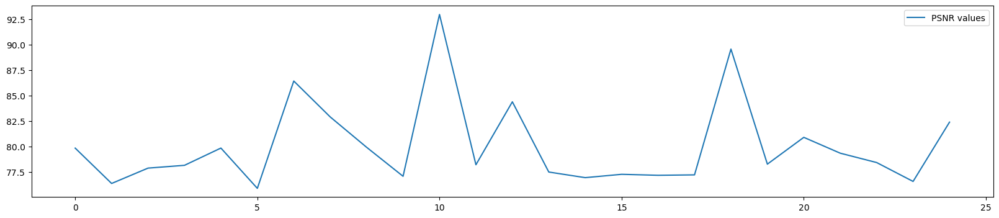

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 92.94281927548559
Minimum PSNR value: 75.89938128282526
Average PSNR value: 80.0588363106026


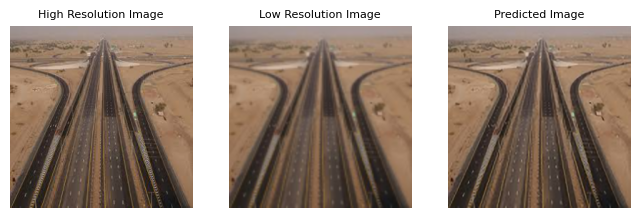

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 79.84382240689713


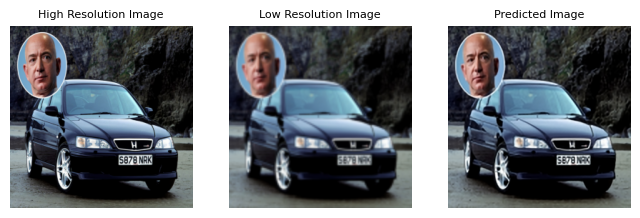

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 76.3794976067739


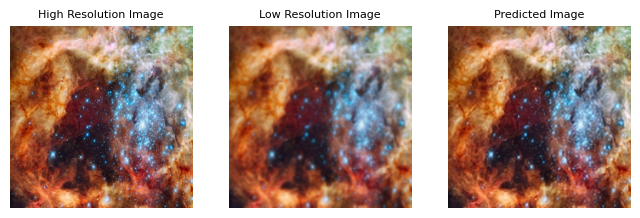

PSNR value 77.88437684189171


In [44]:
ml_20_pred = model_l20.predict(test_low_image)
ml_20_psnr = PSNR(test_high_image,ml_20_pred)
plot_psnr(ml_20_psnr)
plot_output(test_high_image,test_low_image,ml_20_pred,ml_20_psnr)

In [45]:
model_l20.save_weights('256x256_20_layer_w.h5')

## Loading Set5 dataset, pre-processing by creating low resolution images which setting 
## the scale factor to be 2

In [15]:
def load_set5(scale,size):
    r_size=int(size/scale)
    set5_inp = []
    path = 'C:/Users/edbar/Desktop/Illinois Institute of Technology/1 er Semestre/Deep Learning/Project Final/data_set5/Set5/Set5/Input'
    files = os.listdir(path)
    for i in tqdm(files):       
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (r_size, r_size))
            img = img.astype('float32') / 255.0
            set5_inp.append(img)
    set5_inp=np.array(set5_inp)
    set5_out = []
    path = 'C:/Users/edbar/Desktop/Illinois Institute of Technology/1 er Semestre/Deep Learning/Project Final/data_set5/Set5/Set5/Truth'
    files = os.listdir(path)
    for i in tqdm(files):       
            img = cv2.imread(path + '/'+i,1)
            # open cv reads images in BGR format so we have to convert it to RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            #resizing image
            img = cv2.resize(img, (size, size))
            img = img.astype('float32') / 255.0
            set5_out.append(img)
    set5_out=np.array(set5_out)
    set5_inp=tf.convert_to_tensor(set5_inp)
    set5_inp=resize_images(set5_inp,scale,scale,'channels_last',interpolation='bilinear')
    return set5_inp,set5_out

In [16]:
set5_inp,set5_out = load_set5(2,256)
print('Set5 input shape',set5_inp.shape)
print('Set5 output shape',set5_out.shape)

100%|██████████| 5/5 [00:00<00:00, 411.55it/s]

Set5 input shape (5, 256, 256, 3)
Set5 output shape (5, 256, 256, 3)


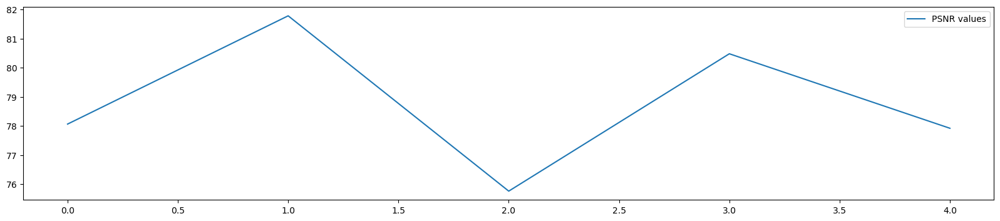

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 81.77888095616224
Minimum PSNR value: 75.76313835219287
Average PSNR value: 78.8006443672707


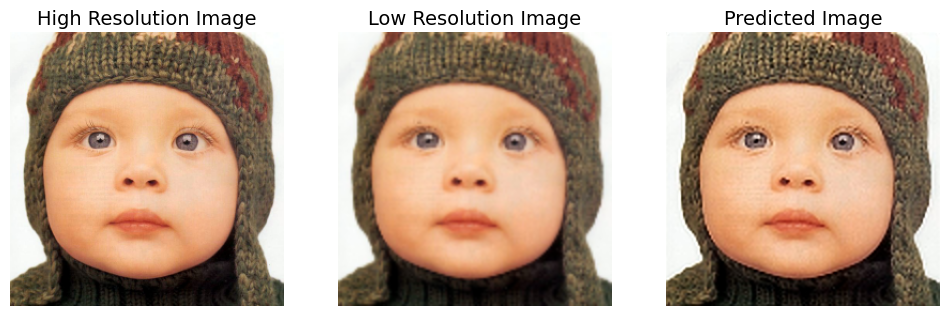

PSNR value 78.0640618743689


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


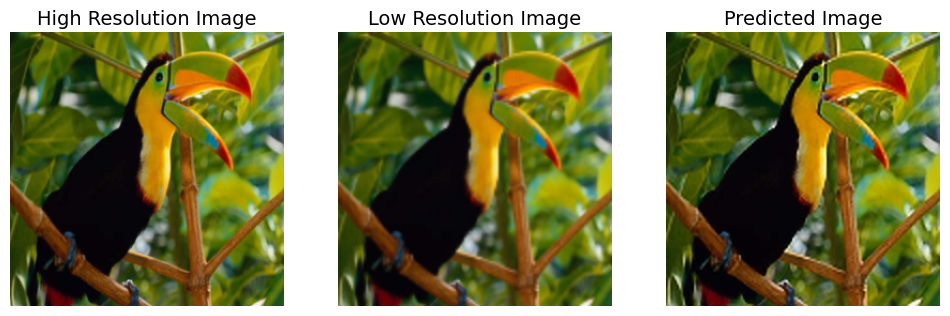

PSNR value 81.77888095616224


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


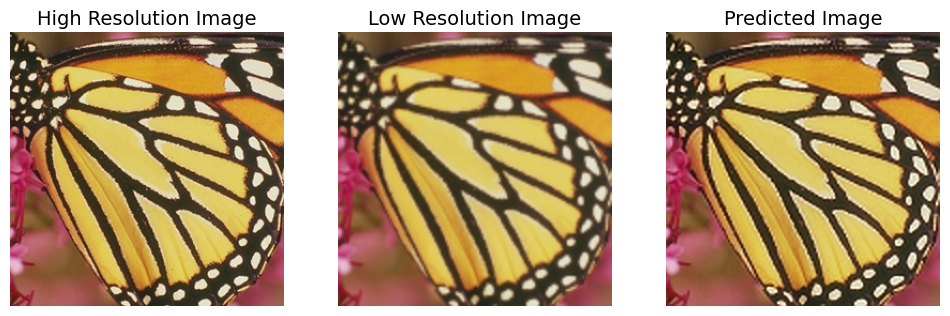

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 75.76313835219287


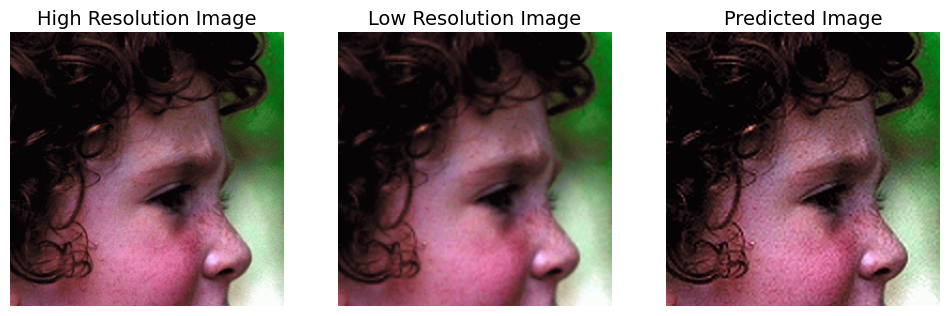

PSNR value 80.47678848266204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


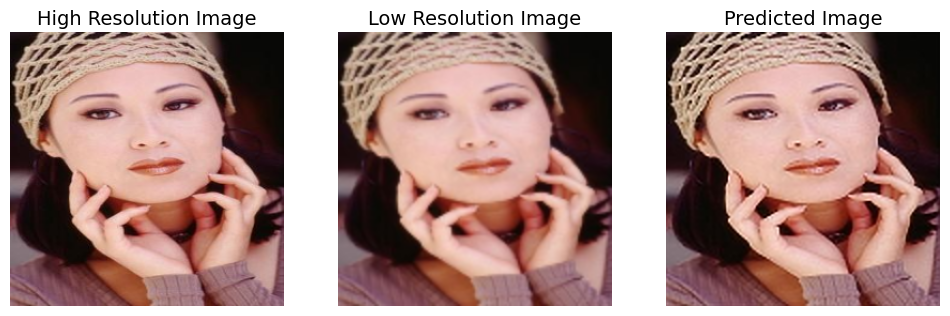

PSNR value 77.92035217096749


In [22]:
pred_l5 = model_l5_ep5.predict(set5_inp)
psnr_l5 = PSNR(set5_out,pred_l5)
plot_psnr(psnr_l5)
plot_output_final(set5_out,set5_inp,pred_l5,psnr_l5)

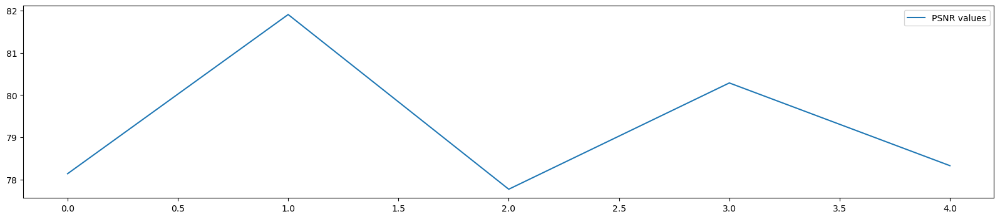

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 81.9099261310472
Minimum PSNR value: 77.77052907292087
Average PSNR value: 79.28723417905445


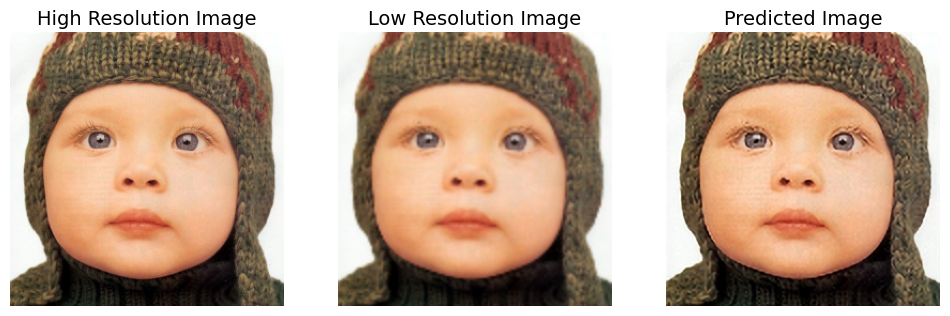

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 78.13814463510342


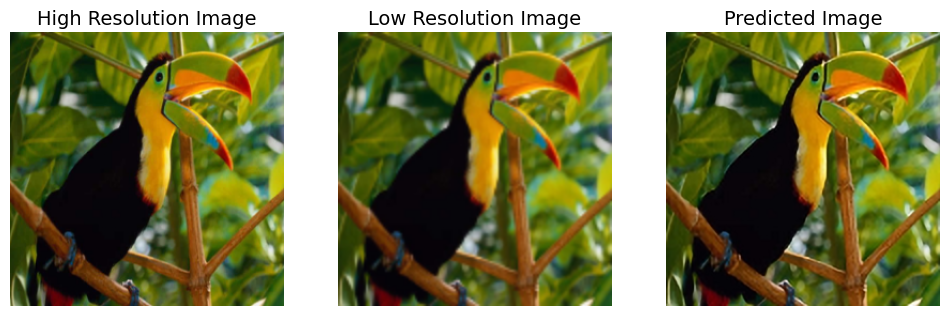

PSNR value 81.9099261310472


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


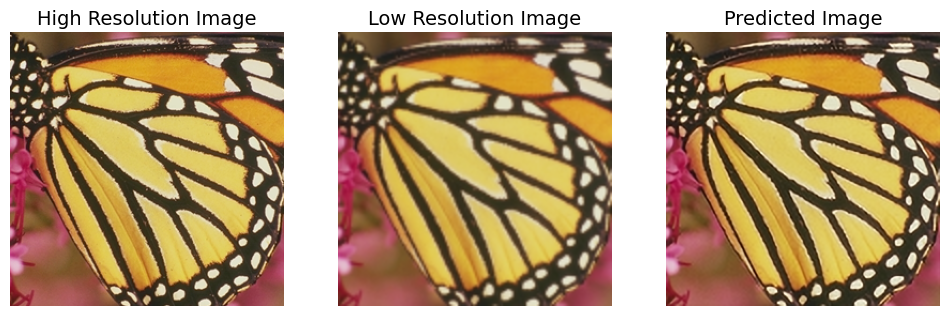

PSNR value 77.77052907292087


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


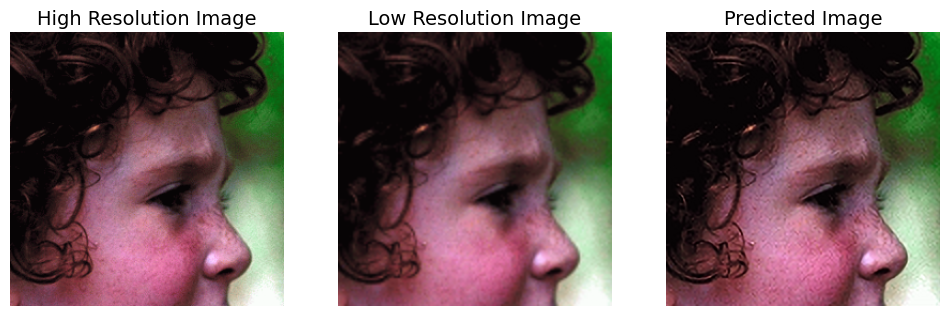

PSNR value 80.28874178803318


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


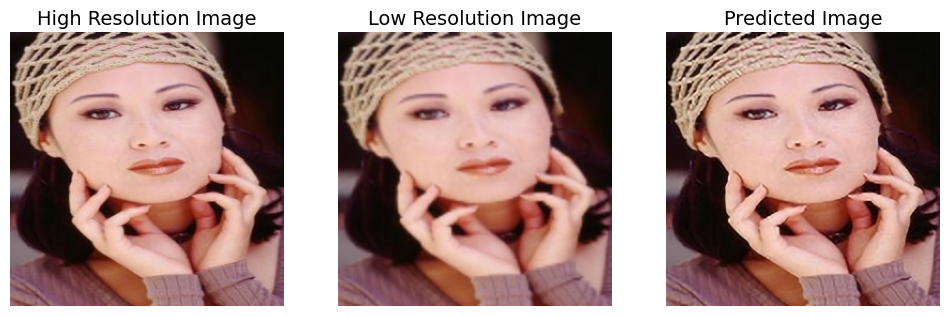

PSNR value 78.32882926816764


In [33]:
pred_l10 = model_l10.predict(set5_inp)
psnr_l10 = PSNR(set5_out,pred_l10)
plot_psnr(psnr_l10)
plot_output_final(set5_out,set5_inp,pred_l10,psnr_l10)

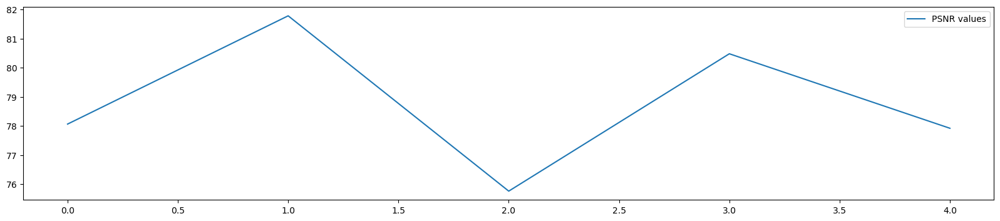

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 81.77888095616224
Minimum PSNR value: 75.76313835219287
Average PSNR value: 78.8006443672707


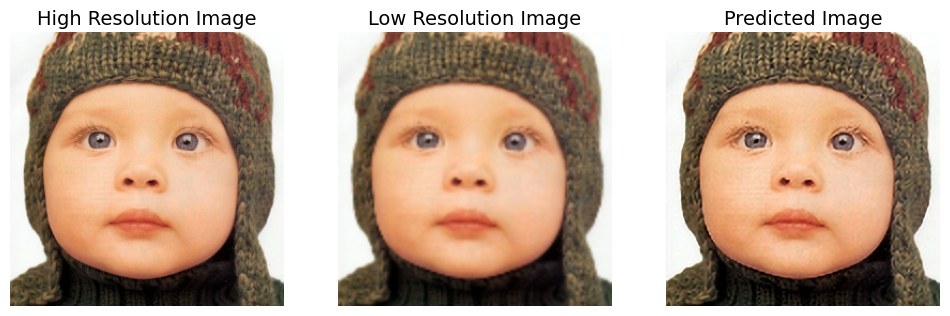

PSNR value 78.0640618743689


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


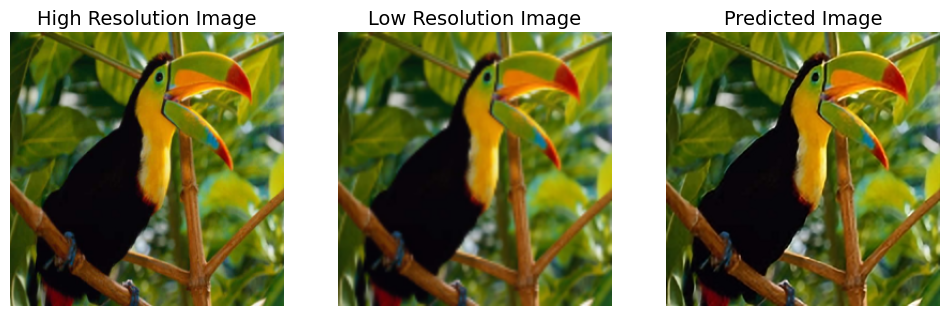

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 81.77888095616224


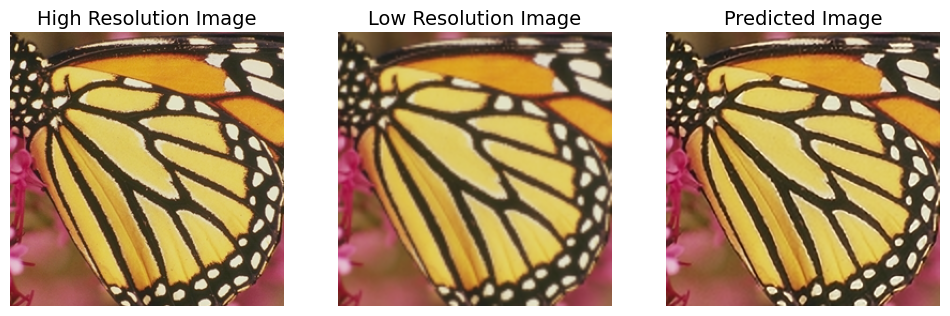

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 75.76313835219287


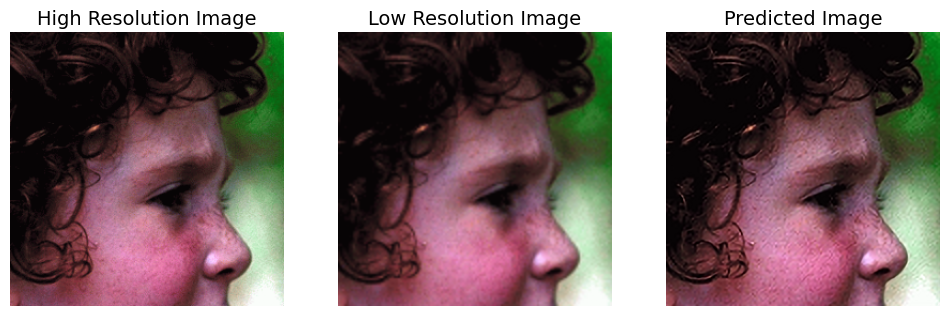

PSNR value 80.47678848266204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


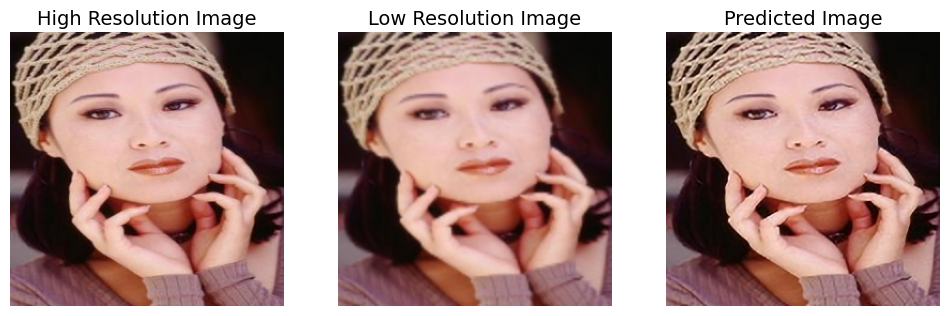

PSNR value 77.92035217096749


In [39]:
pred_l15 = model_l15.predict(set5_inp)
psnr_l15 = PSNR(set5_out,pred_l5)
plot_psnr(psnr_l15)
plot_output_final(set5_out,set5_inp,pred_l15,psnr_l15)

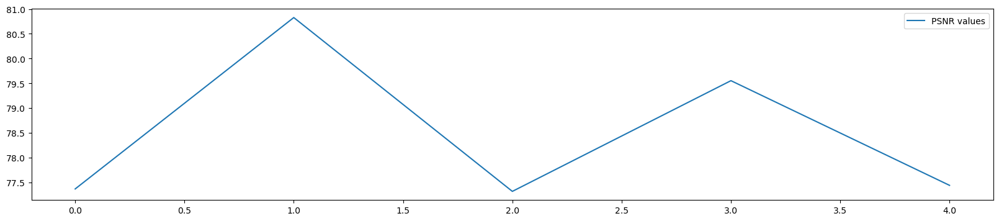

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Maximum psnr value: 80.82844640657788
Minimum PSNR value: 77.31559282103818
Average PSNR value: 78.4999435413671


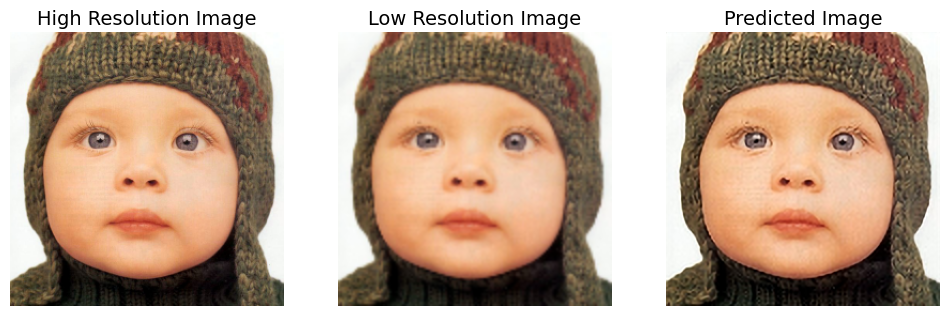

PSNR value 77.36513280655858


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


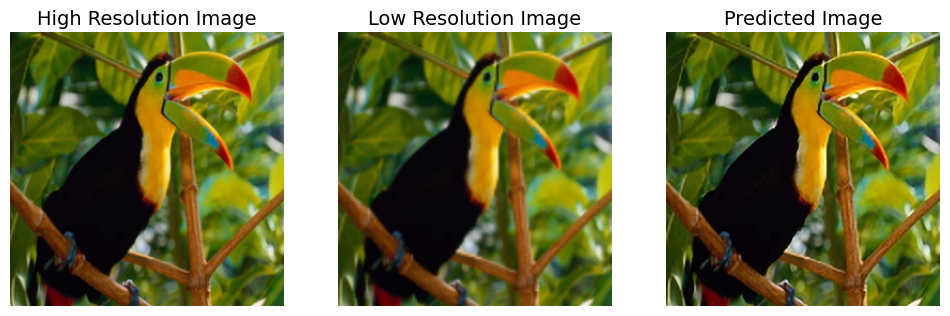

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 80.82844640657788


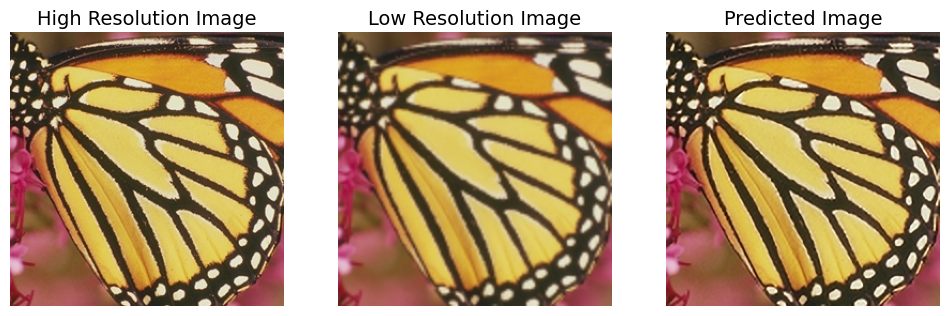

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 77.31559282103818


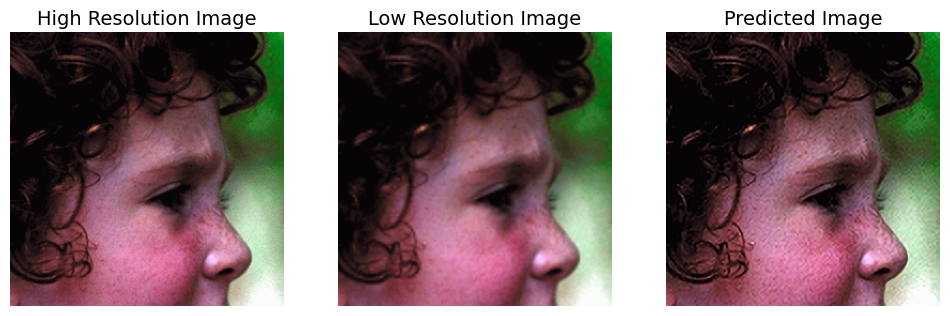

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PSNR value 79.55297032586701


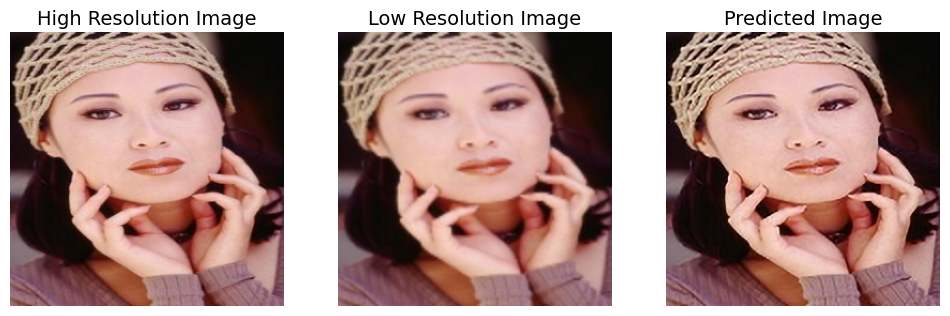

PSNR value 77.43757534679384


In [46]:
pred_l20 = model_l20.predict(set5_inp)
psnr_l20 = PSNR(set5_out,pred_l20)
plot_psnr(psnr_l20)
plot_output_final(set5_out,set5_inp,pred_l20,psnr_l20)